In [1]:
# STREAMING_CHUNK: Загрузка библиотек
import json
import matplotlib.pyplot as plt
import numpy as np
from pathlib import Path

# Специальная команда для Jupyter, чтобы графики рисовались прямо под кодом
%matplotlib inline

print("Библиотеки успешно загружены!")

Библиотеки успешно загружены!


In [2]:
# STREAMING_CHUNK: Чтение файла отчета
# Путь указывается относительно папки 04_notebooks, поэтому делаем шаг назад (../)
report_path = Path("../06_reports/eda_raw_report.json")

if not report_path.exists():
    print("Отчет не найден! Убедись, что путь правильный.")
else:
    with open(report_path, "r", encoding="utf-8") as f:
        report = json.load(f)
    print("Отчет успешно загружен! В нем данных о", report["total_images"], "картинках.")

Отчет успешно загружен! В нем данных о 248 картинках.


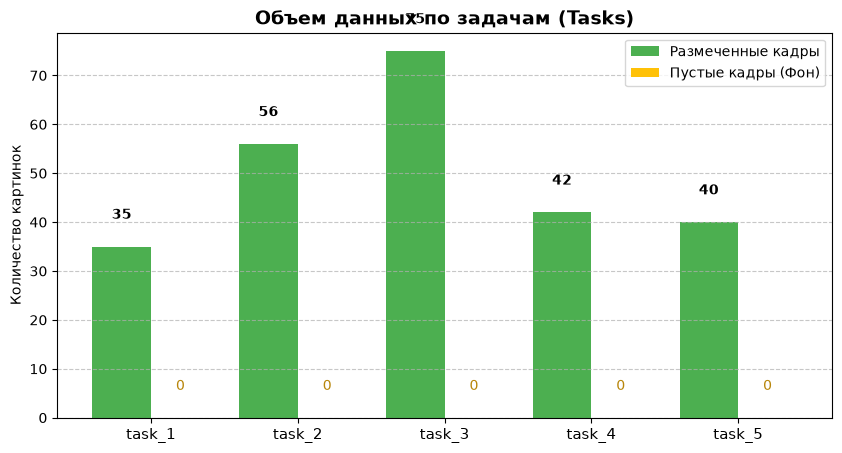

In [3]:
# STREAMING_CHUNK: Отрисовка первого графика (по таскам)
tasks = list(report["per_task_stats"].keys())
total_imgs = [report["per_task_stats"][t]["images"] for t in tasks]
empty_imgs = [report["per_task_stats"][t]["empty_labels"] for t in tasks]
valid_imgs = [tot - emp for tot, emp in zip(total_imgs, empty_imgs)]

fig, ax1 = plt.subplots(figsize=(10, 5))
x = np.arange(len(tasks))
width = 0.4

ax1.bar(x - width/2, valid_imgs, width, label='Размеченные кадры', color='#4CAF50')
ax1.bar(x + width/2, empty_imgs, width, label='Пустые кадры (Фон)', color='#FFC107')

ax1.set_title('Объем данных по задачам (Tasks)', fontsize=14, fontweight='bold')
ax1.set_xticks(x)
ax1.set_xticklabels(tasks, fontsize=11)
ax1.set_ylabel('Количество картинок')
ax1.legend()
ax1.grid(axis='y', linestyle='--', alpha=0.7)

# Добавляем цифры
for i in range(len(tasks)):
    ax1.text(i - width/2, valid_imgs[i] + 5, str(valid_imgs[i]), ha='center', va='bottom', fontweight='bold')
    ax1.text(i + width/2, empty_imgs[i] + 5, str(empty_imgs[i]), ha='center', va='bottom', color='#B8860B')

plt.show()

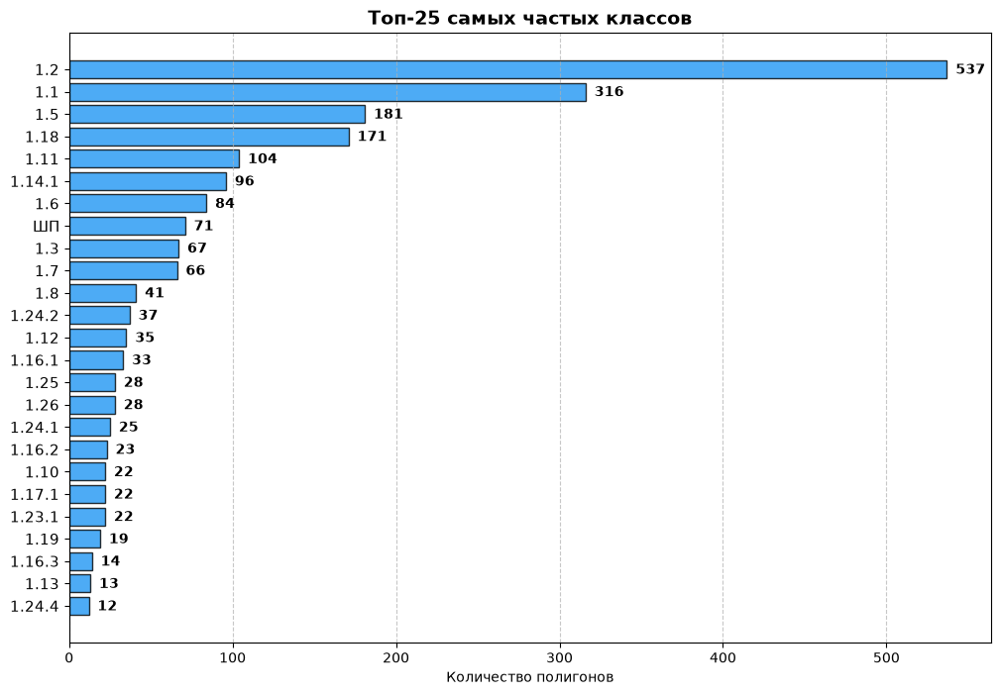

In [4]:
# STREAMING_CHUNK: Отрисовка второго графика (по классам)
class_counts = report["total_class_counts"]
merged_cats = report["merged_categories"]

plot_data = []
# Сопоставляем ID классов с их названиями
for txt_id_str, count in class_counts.items():
    coco_id_str = str(int(txt_id_str) + 1) 
    name = merged_cats.get(coco_id_str, f"Unknown_{txt_id_str}")
    plot_data.append((name, count))

# Сортируем по убыванию
plot_data.sort(key=lambda x: x[1], reverse=True)

# Берем топ-25, чтобы график поместился на экран
top_n = min(25, len(plot_data))
plot_data = plot_data[:top_n]

names = [x[0] for x in plot_data]
counts = [x[1] for x in plot_data]

fig, ax2 = plt.subplots(figsize=(12, 8))
y_pos = np.arange(len(names))

ax2.barh(y_pos, counts, align='center', color='#2196F3', edgecolor='black', alpha=0.8)
ax2.set_yticks(y_pos)
ax2.set_yticklabels(names, fontsize=11)
ax2.invert_yaxis()  # Самые частые будут наверху
ax2.set_xlabel('Количество полигонов')
ax2.set_title(f'Топ-{top_n} самых частых классов', fontsize=14, fontweight='bold')
ax2.grid(axis='x', linestyle='--', alpha=0.7)

for i, v in enumerate(counts):
    ax2.text(v + (max(counts)*0.01), i + 0.2, f"{v:,}".replace(',', ' '), color='black', fontweight='bold')

plt.show()


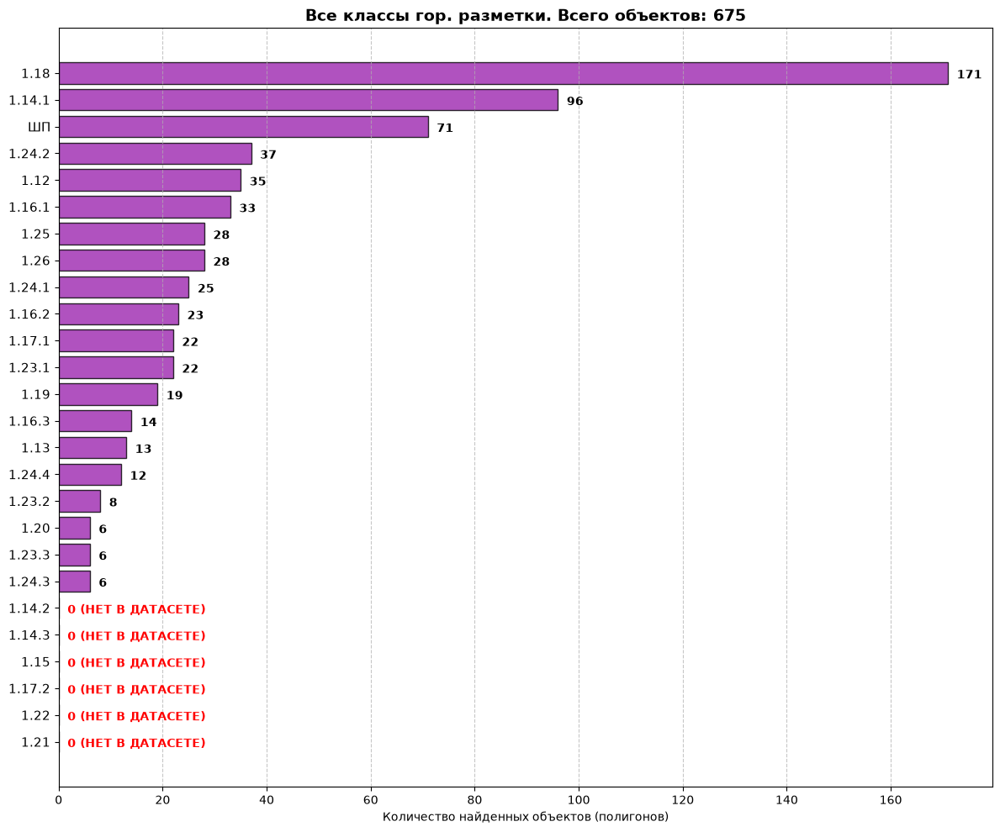

In [5]:
# STREAMING_CHUNK: График ВСЕХ классов горизонтальной разметки, включая нулевые
class_counts = report["total_class_counts"]
merged_cats = report["merged_categories"]

plot_data = []

# Проходим по всему словарю известных классов
for coco_id_str, name in merged_cats.items():
    coco_id = int(coco_id_str)
    txt_id = coco_id - 1 # Переводим ID обратно в формат YOLO (с нуля)
    
    # Берем только горизонтальную разметку (ID >= 11)
    if txt_id >= 11:
        # Ищем, сколько раз класс встретился. Если его нет словаре class_counts, значит 0
        count = class_counts.get(str(txt_id), 0)
        plot_data.append((name, count))

# Сортируем: сначала те, кого много, в самом низу будут нули
plot_data.sort(key=lambda x: x[1], reverse=True)

names = [x[0] for x in plot_data]
counts = [x[1] for x in plot_data]

fig, ax3 = plt.subplots(figsize=(12, 10))
y_pos = np.arange(len(names))

# Рисуем столбцы
bars = ax3.barh(y_pos, counts, align='center', edgecolor='black', alpha=0.8)

# Раскрашиваем столбцы в зависимости от количества
for i, bar in enumerate(bars):
    if counts[i] == 0:
        bar.set_color('#F44336') # Красный для отсутствующих
        bar.set_edgecolor('black')
    else:
        bar.set_color('#9C27B0') # Фиолетовый для присутствующих
        bar.set_edgecolor('black')

ax3.set_yticks(y_pos)
ax3.set_yticklabels(names, fontsize=11)
ax3.invert_yaxis()  # Самые частые наверху
ax3.set_xlabel('Количество найденных объектов (полигонов)')

total_horizontal = sum(counts)
ax3.set_title(f'Все классы гор. разметки. Всего объектов: {total_horizontal}', fontsize=14, fontweight='bold')
ax3.grid(axis='x', linestyle='--', alpha=0.7)

# Добавляем подписи с цифрами (или словом "НЕТ В ДАТАСЕТЕ")
max_val = max(counts) if max(counts) > 0 else 10
for i, v in enumerate(counts):
    color = 'black' if v > 0 else 'red'
    text = f"{v:,}".replace(',', ' ') if v > 0 else "0 (НЕТ В ДАТАСЕТЕ)"
    # Сдвигаем текст немного вправо от столбца
    ax3.text(v + (max_val * 0.01), i + 0.2, text, color=color, fontweight='bold')

plt.tight_layout()
plt.show()


Ищем примеры для 20 классов...
Успешно собрано примеров: 20


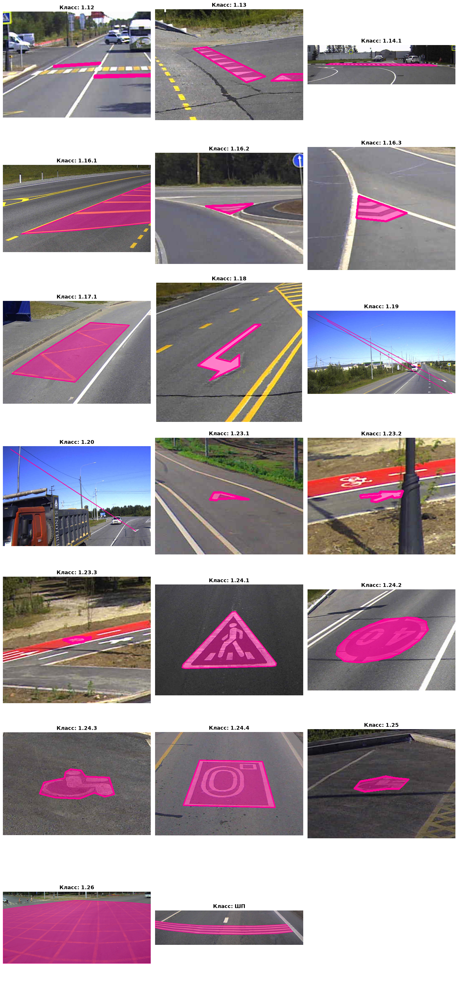

In [6]:
# STREAMING_CHUNK: Подключение библиотеки компьютерного зрения
import cv2
import numpy as np
from pathlib import Path
import math

# STREAMING_CHUNK: Поиск одной картинки для каждого нужного класса
labels_dir = Path("../02_yolo_dataset/labels")
images_dir = Path("../02_yolo_dataset/images")

# Собираем ID классов, которые нам нужны (горизонтальная разметка, ID >= 11)
target_classes = {int(txt_id) for txt_id in report["total_class_counts"].keys() if int(txt_id) >= 11}
found_examples = {} # Здесь будем хранить {class_id: (image_path, label_path)}

print(f"Ищем примеры для {len(target_classes)} классов...")

# Сканируем датасет, пока не найдем по одному примеру на каждый класс
for label_path in labels_dir.rglob("*.txt"):
    if not target_classes:
        break # Все нужные классы найдены, останавливаем поиск
        
    with open(label_path, "r", encoding="utf-8") as f:
        lines = f.readlines()
        
    for line in lines:
        parts = line.strip().split()
        if not parts: continue
        
        c_id = int(parts[0])
        if c_id in target_classes:
            # Нашли нужный класс! Ищем соответствующую картинку
            split_name = label_path.parent.name # train, val или test
            img_path = images_dir / split_name / (label_path.stem + ".jpg")
            if not img_path.exists():
                img_path = images_dir / split_name / (label_path.stem + ".png")
                
            if img_path.exists():
                found_examples[c_id] = (img_path, label_path)
                target_classes.remove(c_id) # Больше этот класс не ищем
            break # Переходим к следующему .txt файлу

print(f"Успешно собрано примеров: {len(found_examples)}")

# STREAMING_CHUNK: Определение функции для вырезания (кропа) объекта
def get_cropped_example(img_path, lbl_path, target_id):
    """Читает картинку, рисует маску и вырезает область вокруг объекта"""
    # Обход бага OpenCV с путями на кириллице/Windows
    img_array = np.fromfile(str(img_path), np.uint8)
    img = cv2.imdecode(img_array, cv2.IMREAD_COLOR)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    h, w, _ = img.shape
    
    crop_box = None
    
    with open(lbl_path, "r", encoding="utf-8") as f:
        lines = f.readlines()
        
    for line in lines:
        parts = line.strip().split()
        if not parts: continue
        
        c_id = int(parts[0])
        # YOLO формат: class_id x1 y1 ... xn yn (нормализованные от 0 до 1)
        coords = [float(x) for x in parts[1:]]
        points = np.array(coords).reshape(-1, 2)
        points[:, 0] *= w
        points[:, 1] *= h
        points = points.astype(np.int32)
        
        # Рисуем все объекты ЭТОГО класса на картинке полупрозрачным маджента-цветом
        if c_id == target_id:
            color = (255, 0, 150) # Ярко-розовый, отлично виден на сером асфальте
            cv2.polylines(img, [points], isClosed=True, color=color, thickness=3)
            overlay = img.copy()
            cv2.fillPoly(overlay, [points], color)
            cv2.addWeighted(overlay, 0.5, img, 0.5, 0, img)
            
            # Запоминаем границы самого первого найденного объекта для обрезки
            if crop_box is None:
                x_min, y_min = np.min(points, axis=0)
                x_max, y_max = np.max(points, axis=0)
                crop_box = (x_min, y_min, x_max, y_max)
                
    # Вырезаем область (Crop) с отступами (Padding)
    if crop_box:
        x_min, y_min, x_max, y_max = crop_box
        pad = 120 # Отступ в пикселях, чтобы было видно контекст (асфальт вокруг)
        
        crop_y1 = max(0, y_min - pad)
        crop_y2 = min(h, y_max + pad)
        crop_x1 = max(0, x_min - pad)
        crop_x2 = min(w, x_max + pad)
        
        return img[crop_y1:crop_y2, crop_x1:crop_x2]
        
    return img # Фолбэк: если что-то пошло не так, вернем целую картинку

# STREAMING_CHUNK: Отрисовка галереи найденных классов
# Настраиваем сетку графиков (по 3 картинки в ряд)
cols = 3
rows = math.ceil(len(found_examples) / cols)

# Создаем большое полотно
fig, axes = plt.subplots(rows, cols, figsize=(16, 5 * rows))
# Если вернулся один массив (1 ряд), оборачиваем в список для удобства
if rows == 1: axes = np.array([axes]) 
axes = axes.flatten()

# Сортируем по ID класса, чтобы они шли по порядку (1.12, 1.13 и т.д.)
for i, (c_id, (img_path, lbl_path)) in enumerate(sorted(found_examples.items())):
    cropped_img = get_cropped_example(img_path, lbl_path, c_id)
    
    ax = axes[i]
    ax.imshow(cropped_img)
    
    # Получаем красивое имя класса из отчета
    coco_id_str = str(c_id + 1)
    class_name = merged_cats.get(coco_id_str, f"Unknown_{c_id}")
    
    ax.set_title(f"Класс: {class_name}", fontsize=13, fontweight="bold")
    ax.axis("off")

# Убираем пустые рамки, если картинок меньше, чем ячеек в сетке
for j in range(len(found_examples), len(axes)):
    axes[j].axis("off")

plt.tight_layout()
plt.show()

## Строгая проверка финального датасета
Этот код проверит датасет `02_yolo_dataset/horizontal` на частые ошибки, из-за которых модель может плохо сходиться (прыгать лосс, низкая точность).

In [3]:
import cv2
import os
from pathlib import Path
from tqdm.notebook import tqdm

dataset_path = Path(r"../02_yolo_dataset/horizontal")
num_classes = 26  # Ожидаем 26 классов (0-25)

errors = []

for split in ['train', 'val', 'test']:
    images_dir = dataset_path / 'images' / split
    labels_dir = dataset_path / 'labels' / split
    
    if not images_dir.exists(): continue
    
    image_files = list(images_dir.glob('*.jpg'))
    print(f"Проверка {split}: {len(image_files)} файлов...")
    
    for img_path in tqdm(image_files):
        # 1. Проверка на битые картинки
        import numpy as np
        img = cv2.imdecode(np.fromfile(img_path, dtype=np.uint8), cv2.IMREAD_COLOR)
        if img is None:
            errors.append(f"БИТАЯ КАРТИНКА: {img_path}")
            continue
            
        # 2. Проверка соответствия файлов
        label_path = labels_dir / (img_path.stem + '.txt')
        if not label_path.exists():
            errors.append(f"НЕТ РАЗМЕТКИ ДЛЯ: {img_path}")
            continue
            
        # 3. Проверка формата разметки
        with open(label_path, 'r', encoding='utf-8') as f:
            lines = f.readlines()
            
        for line_idx, line in enumerate(lines):
            parts = line.strip().split()
            if not parts: continue
            
            try:
                class_id = int(parts[0])
                coords = [float(x) for x in parts[1:]]
            except ValueError:
                errors.append(f"ОШИБКА ЧТЕНИЯ ЧИСЕЛ: {label_path} (строка {line_idx+1})")
                continue
                
            # Проверка ID класса
            if class_id < 0 or class_id >= num_classes:
                errors.append(f"НЕВЕРНЫЙ КЛАСС ({class_id}): {label_path}")
                
            # Проверка координат (должны быть нормализованы 0.0 - 1.0)
            for c in coords:
                if c < 0.0 or c > 1.0:
                    errors.append(f"КООРДИНАТЫ ВНЕ ГРАНИЦ [0, 1] ({c}): {label_path}")
                    break

if not errors:
    print("\n Датасет полностью валиден. Ошибок не найдено.")
    print("Если модель прыгает по лоссу, проблема НЕ в битых файлах или кривых координатах.")
else:
    print(f"\n НАЙДЕНО ОШИБОК: {len(errors)}")
    for e in errors[:20]:
        print(e)
    if len(errors) > 20:
        print("... и еще больше")


Проверка train: 753 файлов...


  0%|          | 0/753 [00:00<?, ?it/s]

Проверка val: 155 файлов...


  0%|          | 0/155 [00:00<?, ?it/s]

Проверка test: 266 файлов...


  0%|          | 0/266 [00:00<?, ?it/s]


 Датасет полностью валиден. Ошибок не найдено.
Если модель прыгает по лоссу, проблема НЕ в битых файлах или кривых координатах.


## 👁️ Визуальная проверка разметки
Давайте случайным образом выберем 20 картинок из тренировочного датасета и отрисуем на них маски (полигоны). Это финальный шаг для полной уверенности.

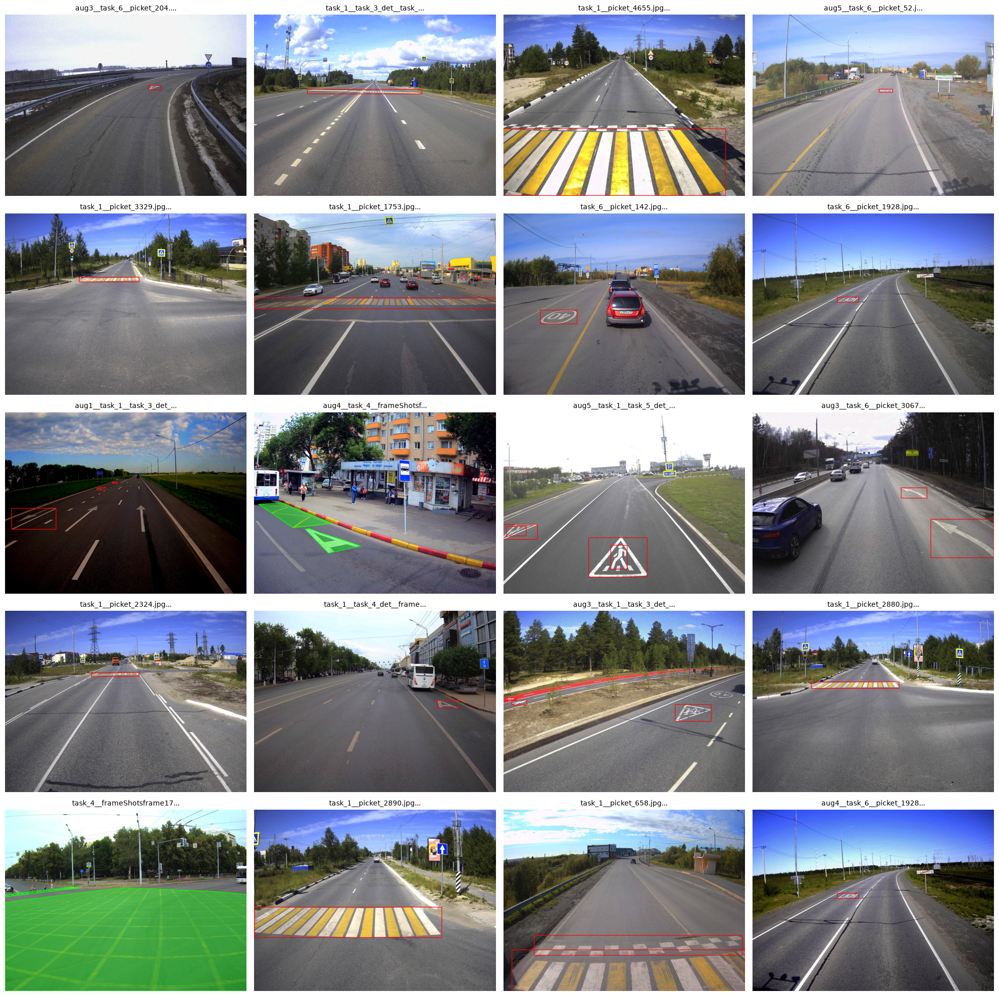

In [4]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
import random

dataset_path = Path(r"../02_yolo_dataset/horizontal")
images_dir = dataset_path / 'images' / 'train'
labels_dir = dataset_path / 'labels' / 'train'

# Собираем все картинки, у которых есть разметка
all_images = list(images_dir.glob('*.jpg'))
valid_images = [img for img in all_images if (labels_dir / (img.stem + '.txt')).exists()]

# Берем 20 случайных
sample_images = random.sample(valid_images, min(20, len(valid_images)))

fig, axes = plt.subplots(5, 4, figsize=(20, 20))
axes = axes.flatten()

for idx, img_path in enumerate(sample_images):
    # Читаем картинку (cv2.imdecode спасает от кириллицы в путях на Windows)
    img_array = np.fromfile(img_path, dtype=np.uint8)
    img = cv2.imdecode(img_array, cv2.IMREAD_COLOR)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    h, w = img.shape[:2]
    
    label_path = labels_dir / (img_path.stem + '.txt')
    with open(label_path, 'r', encoding='utf-8') as f:
        lines = f.readlines()
        
    for line in lines:
        parts = line.strip().split()
        if len(parts) > 5:
            # Формат сегментации: class_id, x1, y1, x2, y2, ...
            coords = [float(x) for x in parts[1:]]
            # Превращаем в пары (x, y) и масштабируем до размеров картинки
            pts = np.array(coords).reshape(-1, 2)
            pts[:, 0] *= w
            pts[:, 1] *= h
            pts = pts.astype(np.int32)
            
            # Рисуем контур полигона
            cv2.polylines(img, [pts], isClosed=True, color=(0, 255, 0), thickness=3)
            # Немного заливаем цветом для наглядности
            overlay = img.copy()
            cv2.fillPoly(overlay, [pts], color=(0, 255, 0))
            img = cv2.addWeighted(overlay, 0.4, img, 0.6, 0)
            
        elif len(parts) == 5:
            # На случай BBox-разметки: class_id, x_center, y_center, width, height
            _, cx, cy, bw, bh = map(float, parts)
            x1 = int((cx - bw/2) * w)
            y1 = int((cy - bh/2) * h)
            x2 = int((cx + bw/2) * w)
            y2 = int((cy + bh/2) * h)
            cv2.rectangle(img, (x1, y1), (x2, y2), (255, 0, 0), 3)
            
    ax = axes[idx]
    ax.imshow(img)
    ax.set_title(img_path.name[:25] + "...", fontsize=10)
    ax.axis('off')

plt.tight_layout()
plt.show()
